In [1]:
import pandas as pd
from pandas import DataFrame as df
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import wntr as wn
import networkx as nx
from collections import defaultdict
import tensorflow as tf

In [2]:
anomalyFree = "/Users/kavyaub/Documents/mySubjects/ConEdison/NYU_LeakData/LeakData_ZeroDegrees/NYU Anamoly Data_ZeroDeg_Pipes.csv"
nFile0=pd.read_csv(anomalyFree)

In [3]:
anomaly = "/Users/kavyaub/Documents/mySubjects/ConEdison/NYU_LeakData/LeakData_ZeroDegrees/NYU Anamoly Data_ZeroDeg_Pipes_Leak1.csv"
nFile1=pd.read_csv(anomaly)

In [4]:
def get_file(name):
    anomaly = "/Users/kavyaub/Documents/mySubjects/ConEdison/NYU_LeakData"+name
    nFile=pd.read_csv(anomaly)
    return nFile

In [5]:
def flowDeviation(file0, file1):
    res_arr = file1
    res_arr['FlowDeviation']= file1.FacilityFlowAbsolute
    res_arr.FlowDeviation = abs(res_arr.FacilityFlowAbsolute.subtract(file0.FacilityFlowAbsolute))/file0.FacilityFlowAbsolute
    return res_arr

In [6]:
preDir = "/LeakData_ZeroDegrees/"
name0_11="NYU Anamoly Data_ZeroDeg_Pipes_Leak11.csv"
name0_21="NYU Anamoly Data_ZeroDeg_Pipes_Leak21.csv"
name0_31="NYU Anamoly Data_ZeroDeg_Pipes_Leak31.csv"
name0_41="NYU Anamoly Data_ZeroDeg_Pipes_Leak41.csv"

leak0_11 = get_file(preDir+name0_11)
leak0_21 = get_file(preDir+name0_21)
leak0_31 = get_file(preDir+name0_31)
leak0_41 = get_file(preDir+name0_41)

In [7]:
res0_1 = flowDeviation(nFile0,nFile1)
res0_11 = flowDeviation(nFile0,leak0_11)
res0_21 = flowDeviation(nFile0,leak0_21)
res0_31 = flowDeviation(nFile0,leak0_31)
res0_41 = flowDeviation(nFile0,leak0_41)

In [8]:
res0_1 = res0_1.fillna(value=0.0)
res0_11 = res0_11.fillna(value=0.0)
res0_21 = res0_21.fillna(value=0.0)
res0_31 = res0_31.fillna(value=0.0)
res0_41 = res0_41.fillna(value=0.0)

In [87]:
def draw_graph(nodeArr,preshArr):
    cntrlnd = '0BEC50B8'

    G = nx.Graph()

    pos_dict = defaultdict(list)
    for i, j, k in zip(nodeArr.NAME,nodeArr.NodeXCoordinate,nodeArr.NodeYCoordinate):
        pos_dict[i].append(j)
        pos_dict[i].append(k)
    pos_dict0 = dict(pos_dict)

    #nodepressure_dict0 = {val:item for val, item in zip(nodeArr.NAME,nodeArr.FlowDeviation)}

    #node_list = list(nodeArr.NAME)
    edge_list = list(preshArr.NAME)
    G.add_nodes_from(pos_dict0.keys())
    #for n in node_list:
    #    G.nodes[n]['pos'] = pos_dict0[n]
    #    G.nodes[n]['flow'] = nodepressure_dict0[n]

    for i, label in enumerate(preshArr['NAME']):
        pdest = preshArr['FacilityToNodeName'].iloc[i]
        psource = preshArr['FacilityFromNodeName'].iloc[i]
        flow = preshArr['FlowDeviation'].iloc[i]
        name = preshArr['NAME'].iloc[i]
        G.add_edge(psource, pdest, p = flow, n = name)

    n_data = list(G.nodes(data=True))
    p_data = list(G.edges(data=True))

    #nodeinfo = nx.get_node_attributes(G, 'pressure')
    edgeinfo = nx.get_edge_attributes(G, 'flow')
    #nodeinfo[cntrlnd]

    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 30
    fig_size[1] = 30
    plt.rcParams["figure.figsize"] = fig_size
    print("Current size:", fig_size)

    labels = {}
    labels[cntrlnd] = r'$\delta$'

    nodes = G.nodes()
    edges = G.edges()
    lower = min(preshArr.FlowDeviation)
    upper = max(preshArr.FlowDeviation)
    colors = plt.cm.jet((preshArr.FlowDeviation-lower)/(upper-lower))
    #colors=range(round(upper))
    
    #edges = nx.draw_networkx_edges(G,pos,edge_color=colors,width=4,
    #                           edge_cmap=plt.cm.Blues)
    ec = nx.draw_networkx_edges(G, pos = pos_dict0, edge_color=colors,width=4, with_labels=False,cmap = plt.cm.jet,vmin=lower,vmax=upper)
    nc = nx.draw_networkx_nodes(G, pos = pos_dict0, alpha=1,node_size=25)
    lc = nx.draw_networkx_labels(G, pos = pos_dict0, labels = labels, font_size=32, font_color='r')
    
    plt.colorbar(ec)
    plt.axis('off')
    #plt.savefig("/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/press5.png")
    plt.show()

In [91]:
from mpl_toolkits.mplot3d import Axes3D

def draw_3d(nodeArr,preshArr):

    cntrlnd = '0BEC50B8'

    G = nx.Graph()

    pos_dict = defaultdict(list)
    for i, j, k in zip(nodeArr.NAME,nodeArr.NodeXCoordinate,nodeArr.NodeYCoordinate):
        pos_dict[i].append(j)
        pos_dict[i].append(k)
    pos_dict0 = dict(pos_dict)

    #nodepressure_dict0 = {val:item for val, item in zip(graphArr.NAME,graphArr.PressureDeviation)}
    edgeflow_dict0 = {val:item for val, item in zip(preshArr.NAME, preshArr.FlowDeviation)}

    d3pos_dict = defaultdict(list)
    
    for d in (pos_dict0, edgeflow_dict0): # you can list as many input dicts as you want here
        for key, value in d.items():
            d3pos_dict[key].append(value)
    d3pos_dict0 = dict(d3pos_dict)

    node_list = list(nodeArr.NAME)
    edge_list = list(preshArr.NAME)
    G.add_nodes_from(pos_dict0.keys())
    for n in edge_list:
        G.nodes[n]['pos'] = pos_dict0[n]
        G.nodes[n]['flow'] = edgeflow_dict0[n]

    for i, label in enumerate(preshArr['NAME']):
        pdest = preshArr['FacilityToNodeName'].iloc[i]
        psource = preshArr['FacilityFromNodeName'].iloc[i]
        flow = preshArr['FlowDeviation'].iloc[i]
        name = preshArr['NAME'].iloc[i]
        G.add_edge(psource, pdest, p = flow, n = name)

    def network_plot_3D(G, angle, save=True):
        
        lower = min(preshArr['FlowDeviation'])
        upper = max(preshArr['FlowDeviation'])
        colors = plt.cm.jet((preshArr.FlowDeviation-lower)/(upper-lower))


        # 3D network plot
        with plt.style.context(('ggplot')):

            fig = plt.figure(figsize=(30,30))
            ax = Axes3D(fig)
            ax.set_xlabel('x-coordinates',fontsize=30)
            ax.set_ylabel('y-coordinates',fontsize=30)
            ax.set_zlabel('Pressure Deviation', fontsize=30)
            #ax.set_zlim(0.0,0.3)


            # Loop on the pos dictionary to extract the x,y,z coordinates of each node
            ctr=0
            for key, value in d3pos_dict0.items():
                xi = value[0][0]
                yi = value[0][1]
                zi = value[1]

                # Scatter plot
                ax.scatter(xi, yi, zi, edgecolors=colors[ctr], alpha=0.5, s=80)
                ctr=ctr+1

            # Loop on the list of edges to get the x,y,z, coordinates of the connected nodes
            # Those two points are the extrema of the line to be plotted
            for i,j in enumerate(G.edges()):
                x = np.array((d3pos_dict0[j[0]][0][0], d3pos_dict0[j[1]][0][0]))
                y = np.array((d3pos_dict0[j[0]][0][1], d3pos_dict0[j[1]][0][1]))
                z = np.array((d3pos_dict0[j[0]][1], d3pos_dict0[j[1]][1]))

            # Plot the connecting lines
                ax.plot(x, y, z, c='black',alpha=0.5)

        # Set the initial view
        angleVerticle = 30
        ax.view_init(angleVerticle, angle)
        # Hide the axes
        #ax.set_axis_off()

        if save is not False:
            plt.savefig("/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/Leak_11_ZeroDegrees.png")
            plt.show()
        else:
            plt.show()

        return

    network_plot_3D(G, 60)

In [11]:
max(res0_1.FlowDeviation)

5.145438024480196

In [12]:
max(res0_11.FlowDeviation)

46.72152440002137

In [13]:
max(res0_21.FlowDeviation)

71.12443209150676

In [14]:
max(res0_31.FlowDeviation)

88.23218771714149

In [15]:
max(res0_41.FlowDeviation)

112.89988775455663

In [16]:
res0_1.to_csv(r'/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/pipes1.csv')
res0_11.to_csv(r'/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/pipes11.csv')
res0_21.to_csv(r'/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/pipes21.csv')
res0_31.to_csv(r'/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/pipes31.csv')
res0_41.to_csv(r'/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/pipes41.csv')

In [17]:
from sklearn import svm
svc = svm.SVC(probability=False,  kernel="linear", C=2.8, gamma=.0073,verbose=10)

In [18]:
res0_1["leak"] = 0
for row in res0_1.itertuples():
    if row.FlowDeviation > 40:
        row["leak"] = 1

In [19]:
res0_1['leak'] = np.where(res0_1['FlowDeviation']>=40, 1, 0)
res0_11['leak'] = np.where(res0_11['FlowDeviation']>=40, 1, 0)
res0_21['leak'] = np.where(res0_21['FlowDeviation']>=40, 1, 0)
res0_31['leak'] = np.where(res0_31['FlowDeviation']>=40, 1, 0)
res0_41['leak'] = np.where(res0_41['FlowDeviation']>=40, 1, 0)

In [20]:
leakTable=pd.DataFrame(columns=['leak1','leak2','leak3','leak4','leak5'])
leakTable['leak1']=res0_1['leak']
leakTable['leak2']=res0_11['leak']
leakTable['leak3']=res0_21['leak']
leakTable['leak4']=res0_31['leak']
leakTable['leak5']=res0_41['leak']
leakTable['sumLeaks']=leakTable.leak1+leakTable.leak2+leakTable.leak3+leakTable.leak4+leakTable.leak5

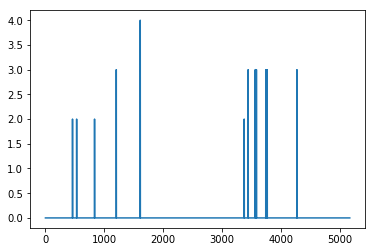

In [21]:
arr=range(res0_1.FlowDeviation.size)
plt.plot(arr,leakTable.sumLeaks)

In [22]:
leakTable.sumLeaks.value_counts()

0    5151
3      11
2       4
1       1
4       1
Name: sumLeaks, dtype: int64

In [23]:
def hightlightColor(r):
    if r['sumLeaks']>3:
        return ['background-color: red']*6
    elif r['sumLeaks']>2:
        return ['background-color: orange']*6
    elif r['sumLeaks']>1:
        return ['background-color: yellow']*6
    elif r['sumLeaks']>0:
        return ['background-color: green']*6
    else:
        return ['background-color: blue']*6

In [24]:
leakTable.style.apply(hightlightColor, axis=1)

Current size: [30, 30]


TypeError: You must first set_array for mappable

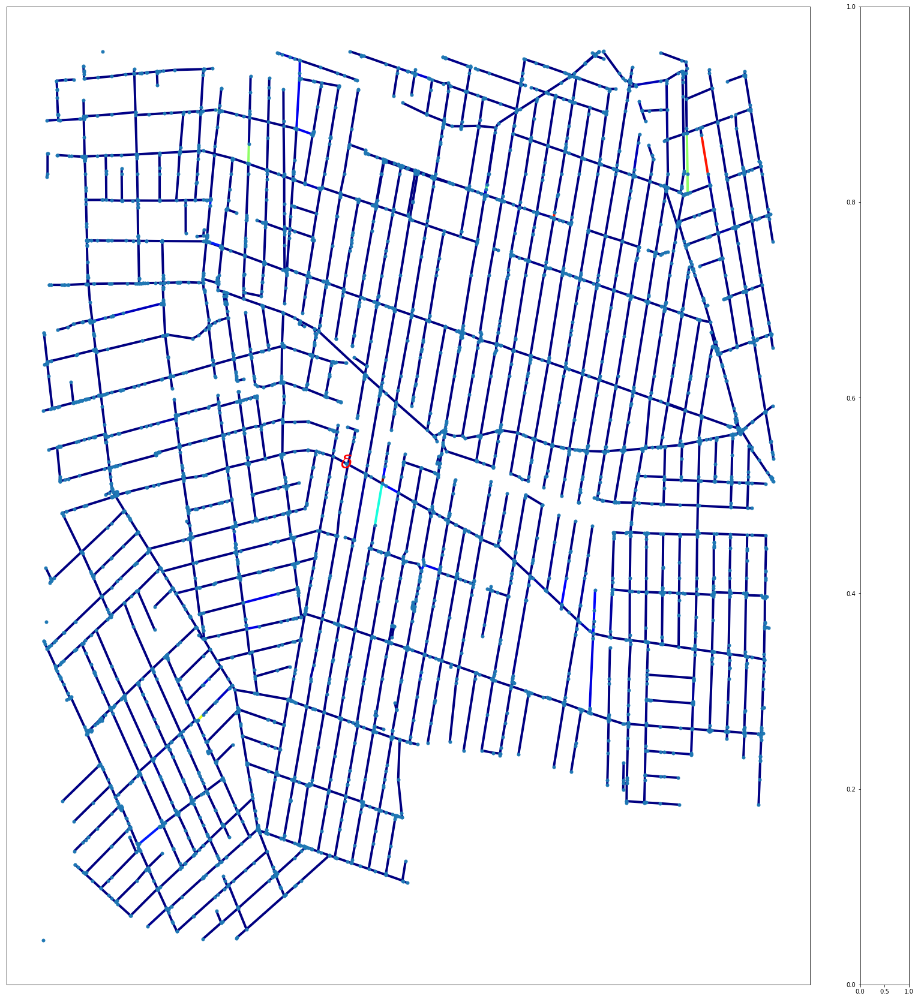

In [88]:
anomalyFreeNode = "/Users/kavyaub/Documents/mySubjects/ConEdison/NYU_LeakData/LeakData_ZeroDegrees/NYU Anamoly Data_ZeroDeg_Nodes.csv"
nodeArr=pd.read_csv(anomalyFreeNode)
draw_graph(nodeArr,res0_41)

In [76]:
anomalyFreeNode = "/Users/kavyaub/Documents/mySubjects/ConEdison/NYU_LeakData/LeakData_ZeroDegrees/NYU Anamoly Data_ZeroDeg_Nodes.csv"
nodeArr=pd.read_csv(anomalyFreeNode)
setOfNames = set(nodeArr['NAME'])
res0_41["FacilityFromNodeNameXCoord"]=0.0
res0_41["FacilityFromNodeNameYCoord"]=0.0
for row in res0_41.iterrows():
    if row[1]['FacilityFromNodeName'] in setOfNames:
        row1 = nodeArr.loc[nodeArr['NAME']==row[1]['FacilityFromNodeName']]
        row.at[1,"FacilityFromNodeNameXCoord"]=row1.iloc[0][3]
        row.at[1,"FacilityFromNodeNameYCoord"]=row1.iloc[0][2]
    elif row[1]['FacilityToNodeName'] in setOfNames:
        row1 = nodeArr.loc[nodeArr['NAME']==row[1]['FacilityToNodeName']]
        row[1]["FacilityFromNodeNameXCoord"]=row1['NodeXCoordinate']
        row[1]["FacilityFromNodeNameYCoord"]=row1['NodeYCoordinate']

AttributeError: 'tuple' object has no attribute 'at'

In [75]:
max(res0_41["FacilityFromNodeNameXCoord"])

0.0

In [43]:
final_res0_41 = np.array([res0_41['NAME'],res0_41['FacilityFromNodeName'],res0_41['FacilityToNodeName'],res0_41['FlowDeviation'],[0]*res0_41.NAME.size,[0]*res0_41.NAME.size,[0]*res0_41.NAME.size,[0]*res0_41.NAME.size])

anomalyFreeNode = "/Users/kavyaub/Documents/mySubjects/ConEdison/NYU_LeakData/LeakData_ZeroDegrees/NYU Anamoly Data_ZeroDeg_Nodes.csv"
nodeArr=pd.read_csv(anomalyFreeNode)
setOfNames = set(nodeArr['NAME'])

for i in range(0,final_res0_41[1].size):
    if final_res0_41[1][i] in setOfNames:
        temp = nodeArr.loc[nodeArr['NAME']==final_res0_41[1][i]]
        final_res0_41[4][i]=temp.iloc[0][3]
        final_res0_41[5][i]=temp.iloc[0][2]
    if final_res0_41[2][i] in setOfNames:
        temp = nodeArr.loc[nodeArr['NAME']==final_res0_41[2][i]]
        final_res0_41[6][i]=temp.iloc[0][3]
        final_res0_41[7][i]=temp.iloc[0][2]

In [90]:
#final_res0_41['NAME']=res0_41['NAME']
#final_res0_41['FacilityFromNodeName']=res0_41['FacilityFromNodeName']
#final_res0_41['FacilityToNodeName']=res0_41['FacilityToNodeName']
#final_res0_41['FlowDeviation']=res0_41['FlowDeviation']
#final_res0_41['FacilityFromNodeNameXCoord']=0.0
#final_res0_41['FacilityFromNodeNameYCoord']=0.0
#final_res0_41['FacilityToNodeNameXCoord']=0.0
#final_res0_41['FacilityToNodeNameYCoord']=0.0
draw_3d(nodeArr,res0_41)

AttributeError: 'dict' object has no attribute 'shape'

In [67]:
def draw_graph_np(graphArr):
    cntrlnd = '0BEC50B8'

    G = nx.Graph()

    pos_dict = defaultdict(list)
    for i, j, k in zip(graphArr[0],graphArr[4],graphArr[5]):
        pos_dict[i].append(j)
        pos_dict[i].append(k)
    pos_dict0 = dict(pos_dict)

    #nodepressure_dict0 = {val:item for val, item in zip(nodeArr.NAME,nodeArr.FlowDeviation)}

    #node_list = list(nodeArr.NAME)
    edge_list = list(graphArr[0])
    G.add_nodes_from(pos_dict0.keys())
    #for n in node_list:
    #    G.nodes[n]['pos'] = pos_dict0[n]
    #    G.nodes[n]['flow'] = nodepressure_dict0[n]

    for i in range(0,graphArr[0].size):
        pdest = graphArr[2][i]
        psource = graphArr[1][i]
        flow = graphArr[3][i]
        name = graphArr[0][i]
        G.add_edge(psource, pdest, p = flow, n = name)

    n_data = list(G.nodes(data=True))
    p_data = list(G.edges(data=True))

    #nodeinfo = nx.get_node_attributes(G, 'pressure')
    edgeinfo = nx.get_edge_attributes(G, 'flow')
    #nodeinfo[cntrlnd]

    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 30
    fig_size[1] = 30
    plt.rcParams["figure.figsize"] = fig_size
    print("Current size:", fig_size)

    labels = {}
    labels[cntrlnd] = r'$\delta$'

    nodes = G.nodes()
    edges = G.edges()
    lower = min(graphArr[3])
    upper = max(graphArr[3])
    #colors = plt.cm.jet((graphArr[3]-lower)/(upper-lower))
    #colors=range(round(upper))
    
    #edges = nx.draw_networkx_edges(G,pos,edge_color=colors,width=4,
    #                           edge_cmap=plt.cm.Blues)
    #print(nodeArr.shape)
    #print(colors.shape)
    print(pos_dict0)
    ec = nx.draw_networkx_edges(G, pos = pos_dict0, edge_color=graphArr[3], with_labels=False,cmap = plt.cm.jet)
    nc = nx.draw_networkx_nodes(G, pos = pos_dict0, alpha=1)
    lc = nx.draw_networkx_labels(G, pos = pos_dict0, labels = labels, font_size=32, font_color='r')
    
    plt.colorbar(ec)
    plt.axis('off')
    #plt.savefig("/Users/kavyaub/Documents/mySubjects/ConEdison/screenshots/press5.png")
    plt.show()

Current size: [30, 30]
{'2FB2E59E': ['0BEC44EB', '2FB1A038'], '2FB2E5A0': ['2FB1A038', '2FB90825'], '2FB942F0': ['2FB90825', '2FB1A03B'], '2FB2E5A9': ['2FB1A03B', '2FB1F8B3'], '2FB2E59F': ['2FB1A038', '2FB1A03D'], '2FB2E5B3': ['2FB1A03D', '2FB1F721'], '2FB27DA9': ['2FB1F721', '2FB18180'], '2FB28EE1': ['2FB18180', '2FB90824'], '2FB28E5D': ['2FB19669', '2FB181C9'], '2FB942E7': ['2FB90824', '2FB19669'], '2FB28E5B': ['2FB19669', '2FB181C8'], '2FB28EC4': ['2FB19683', '2FB19691'], '2FB28E5C': ['2FB19669', '2FB1968B'], '2FB28ED7': ['2FB1968B', '2FB1968C'], '2FB28E50': ['2FB1F72C', '2FB19668'], '2FB28ED9': ['2FB1968C', '2FB19668'], '2FB28E59': ['2FB19668', '2FB1968D'], '2FB28EDB': ['2FB1968D', '2FB19667'], '2FB28E57': ['2FB19667', '2FB1968E'], '2FB28EDC': ['2FB1968E', '2FB2084B'], '2FB28E5F': ['2FB1966A', '2FB19683'], '2FB42523': ['2FB2084B', '2FB1966A'], '2FB28E58': ['2FB19667', '2FB1F72D'], '2FB28E5E': ['2FB1966A', '2FB2084D'], '2FB42524': ['2FB2084C', 'Q3No304'], '2FB42525': ['2FB2084D', '2

KeyError: '2FB8733C'

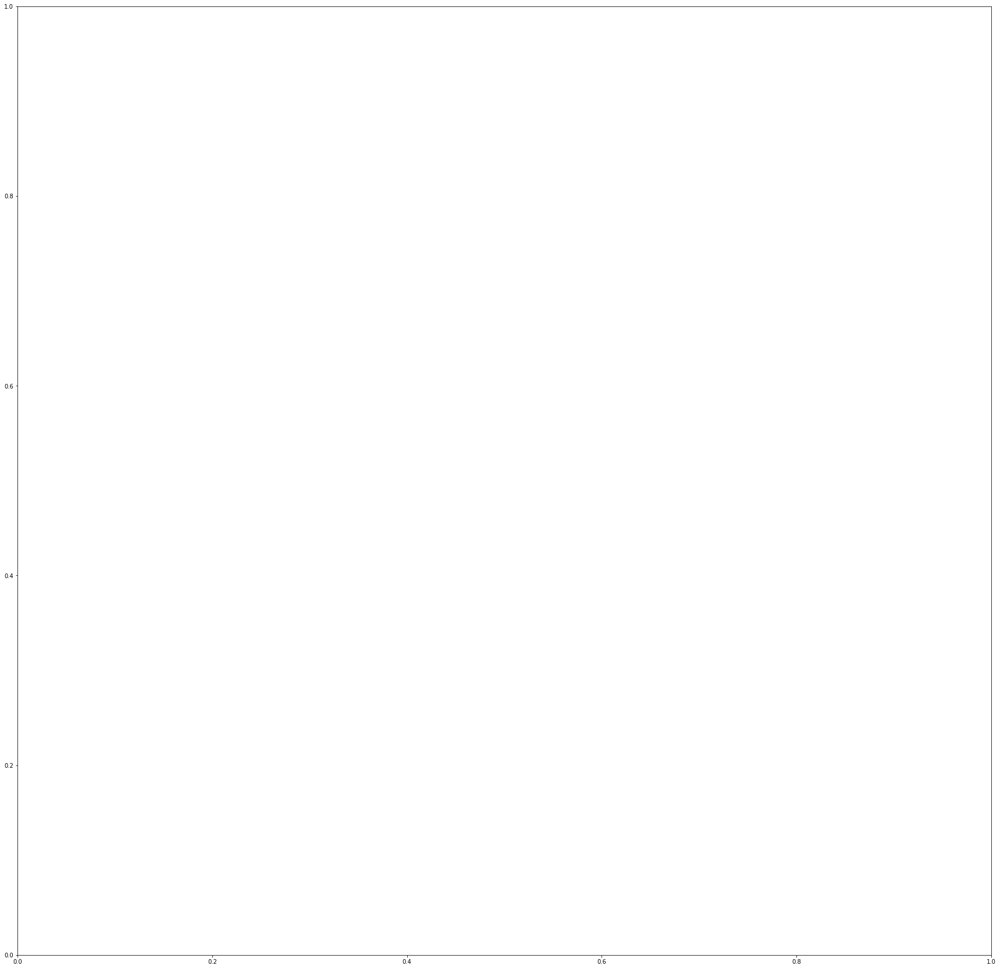

In [68]:
draw_graph_np(final_res0_41)